In [2]:
#Impoting Libraries
import pandas as pd
import matplotlib.pyplot as plt
# import openpyxl
# import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import spacy
from wordcloud import WordCloud
from textblob import TextBlob
# import networkx as nx
from collections import Counter
from itertools import combinations


# Download necessary NLTK data files
nltk.download('punkt')
nltk.download('stopwords')

# Load the spaCy English model
nlp = spacy.load('en_core_web_sm')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jie22\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jie22\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Functions for Wordcloud

In [46]:
# Preprocessing
def preprocess_text(text, remove_stopwords: bool = True):
    """
    Preprocess the input text by applying the following steps:
    1. Convert to lowercase.
    2. Remove punctuation and special characters.
    3. Tokenize the text.
    4. Remove stopwords.
    5. Perform lemmatization using spaCy.
    6. Optionally, stem words (commented out by default).
    
    Args:
        text (str): The input text to preprocess.
    
    Returns:
        str: Preprocessed text as a single string of words.
    """
    # # Convert to string and handle NaN
    # if not isinstance(text, str):
    #     text = str(text) if text is not None else ""
    
    # # Lowercase the text
    # text = text.lower()
    
    # # Remove punctuation and special characters using regular expressions
    # text = re.sub(r'[^\w\s]', '', text)
    
    # Tokenize the text using NLTK
    tokens = word_tokenize(text)
    
    # Remove stopwords using NLTK
    if remove_stopwords:
        stop_words = set(stopwords.words('english'))
        tokens = [word for word in tokens if word not in stop_words]
    
    # # Lemmatization using spaCy
    # doc = nlp(" ".join(tokens))  # Rejoin tokens before processing with spaCy
    # lemmatized_tokens = [token.lemma_ for token in doc]
    
    # Return the preprocessed text as a space-separated string of words
    # return " ".join(lemmatized_tokens)
    return tokens

In [34]:
def create_wordcloud(preprocessed_data: list[str], title: str = None, ax: plt.Axes = None, **kwargs) -> None:
    """
    Creating the wordcloud for the given dataset:
    1. Merge all the preprocessed sentences into a single string
    2. Call for the wordcloud function
    Args:
        preprocessed_data: list[str],
        title: str = None,
        ax: plt.Axes = None,
        **kwargs: Any
    """
    # Extract text from the 'sentence' column
    text_data = " ".join(preprocessed_data)

    # Create a word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', **kwargs).generate(text_data)

    # Plot the word cloud
    if ax is not None:
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis('off')
    else:
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')

    if title is not None and ax is not None:
        ax.set_title(title, fontsize=16)
    elif title is not None:
        plt.title(title, fontsize=16)
    else:
        plt.title("Word Cloud for 'sentence' Column", fontsize=16)
    # return wordcloud

### Reading Dataset

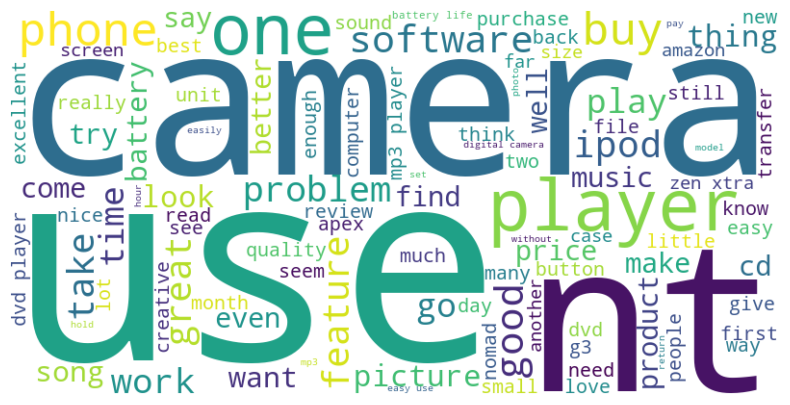

In [48]:
# Creating a conglomerate wordcloud which uses sentences from all datasets
def load_bunch() -> dict[pd.DataFrame]:
    apex = pd.read_csv('../processed_data/apex_ad2600_dvd_player_updated.csv')
    canon = pd.read_csv('../processed_data/canon_g3_updated.csv')
    nikon = pd.read_csv('../processed_data/nikon_coolpix_4300_updated.csv')
    nokia = pd.read_csv('../processed_data/nokia_6610_updated.csv')
    nomad = pd.read_csv('../processed_data/nomad_jukebox_zen_xtra_updated.csv')
    return {
        "apex": apex,
        "canon": canon,
        "nikon": nikon,
        "nokia": nokia,
        "nomad": nomad
    }
bunch = load_bunch()
master_df = pd.concat(bunch.values(), ignore_index=True)

def flatten(list):
    return [item for sublist in list for item in sublist]

preprocessed_data = [preprocess_text(str(text), remove_stopwords = True) for text in master_df['sentence']]
preprocessed_data = flatten(preprocessed_data)
create_wordcloud(preprocessed_data, title = "", max_words = 100)

##### With Stopwords

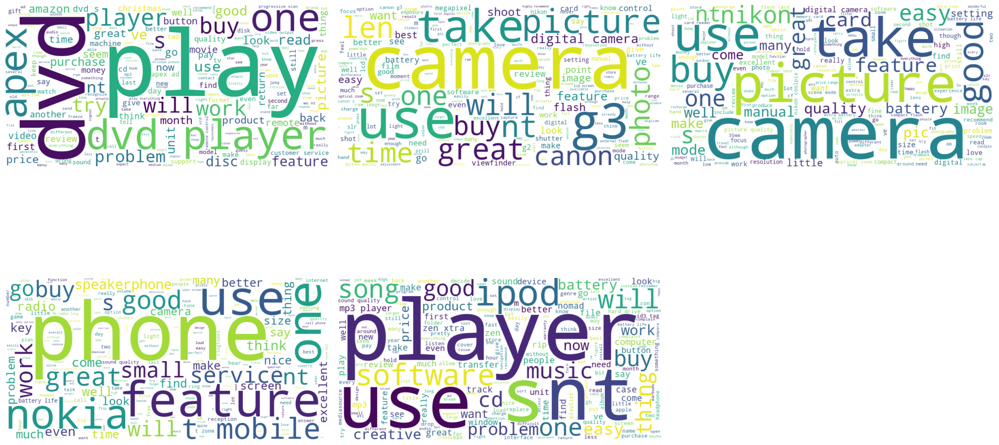

In [ ]:
def plot_product_wordclouds(remove_stopwords: bool, feature_name: str = 'sentence'):
    _, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes: list[plt.Axes] = axes.ravel()
    prod_Lis = ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
    for i, product in enumerate(prod_Lis):
        file_path = f'../processed_data/{product}.csv'  # Replace with the actual file path
        data = pd.read_csv(file_path)
        preprocessed_data = [preprocess_text(str(text), remove_stopwords) for text in data[feature_name]]
        preprocessed_data = flatten(preprocessed_data)
        create_wordcloud(preprocessed_data, ax=axes[i])
    axes[5].remove()

plot_product_wordclouds(remove_stopwords = False)

plt.tight_layout()
plt.show()

##### Without Stopwords

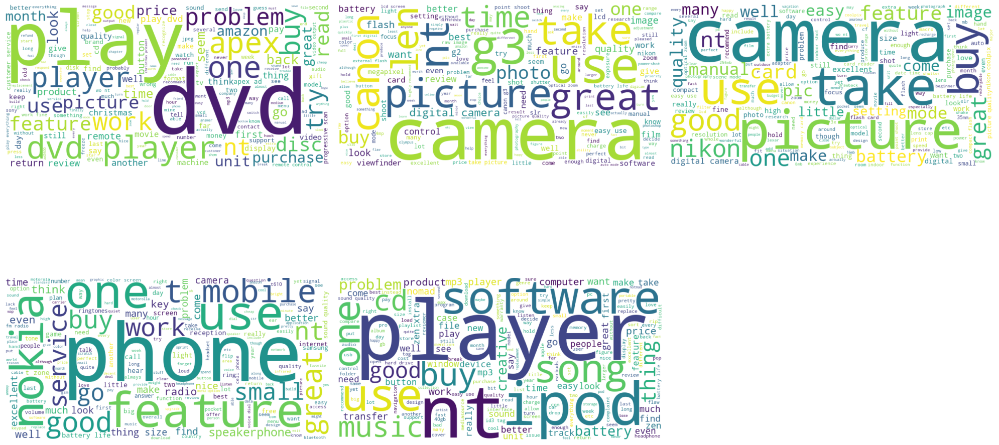

In [51]:
plot_product_wordclouds(remove_stopwords = True)
plt.tight_layout()
plt.show()

##### Wordcount of Title

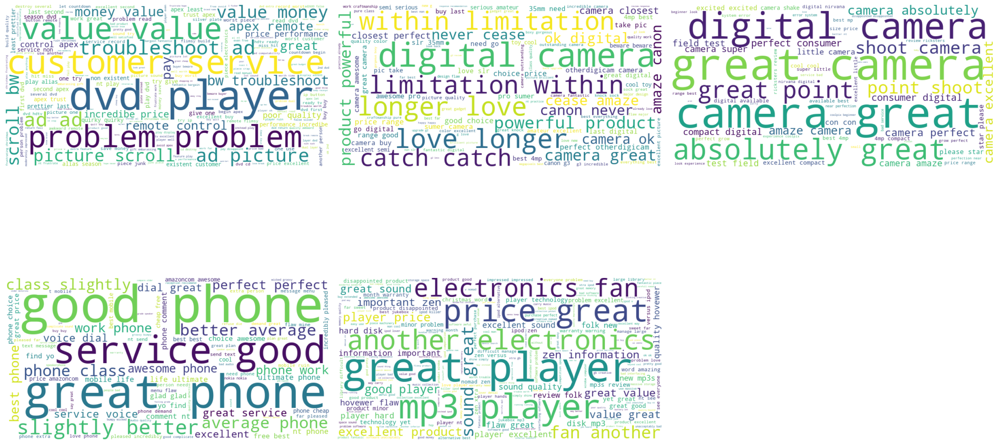

In [ ]:
plot_product_wordclouds(remove_stopwords = True, feature_name = 'title')
plt.tight_layout()
plt.show()

##### High Positive word count

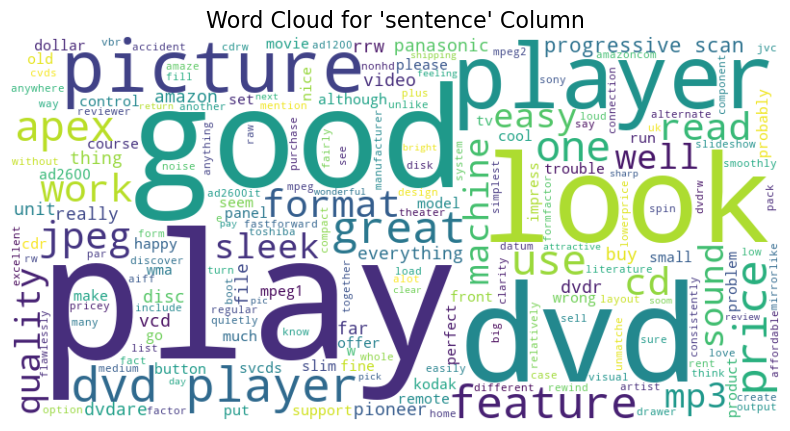

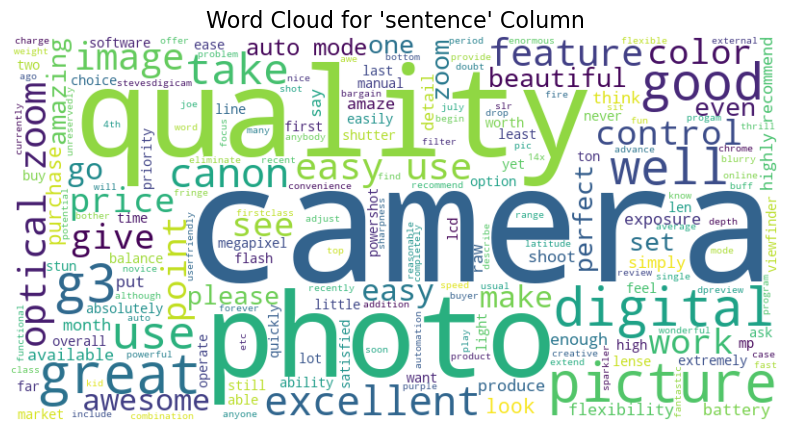

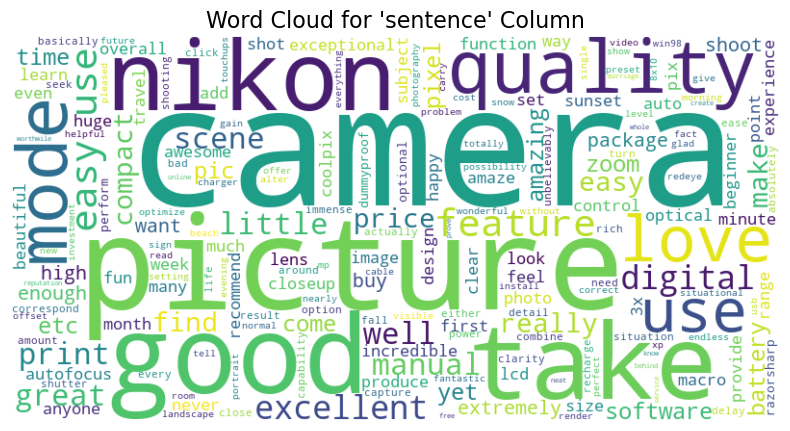

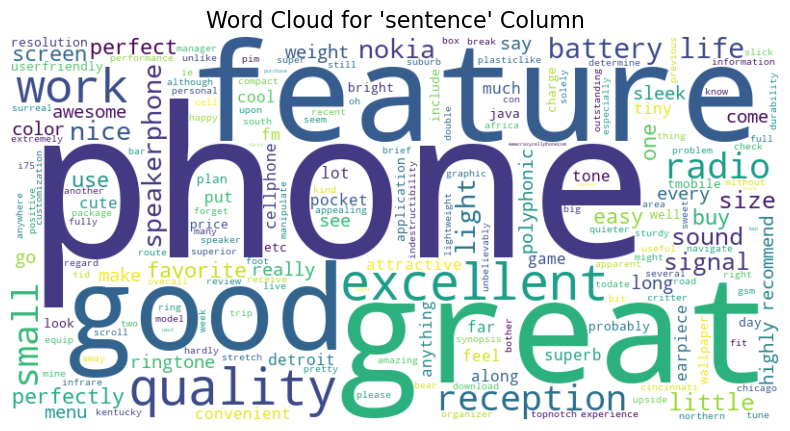

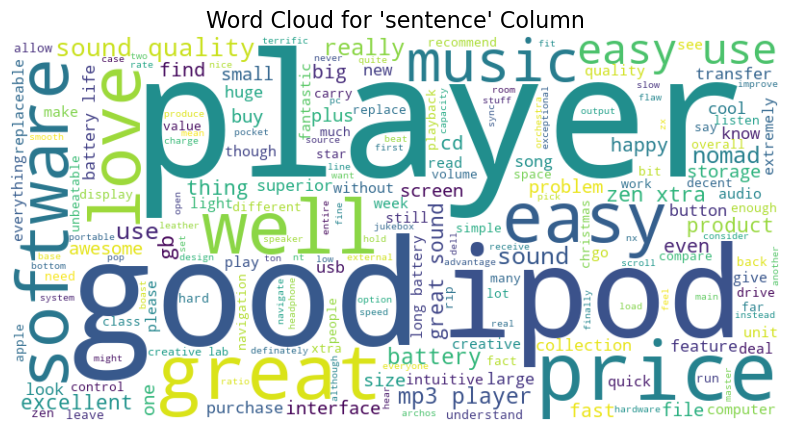

In [ ]:
# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']>=3]
    preprocessed_data = [preprocess_text(text) for text in data['sentence']]
    create_wordcloud(preprocessed_data)


##### Negative Word count

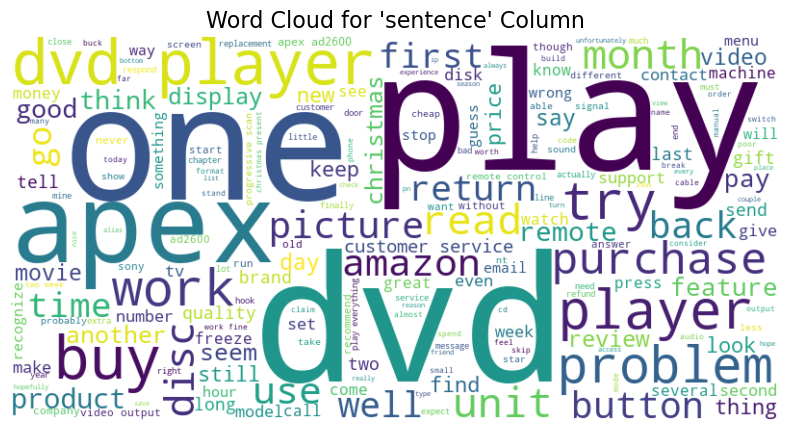

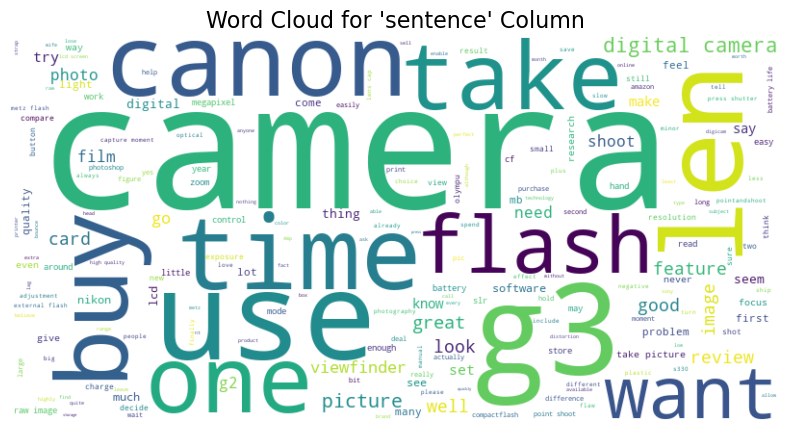

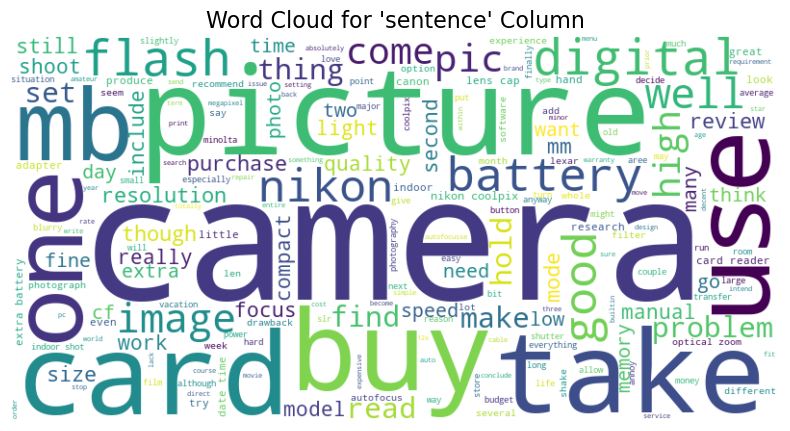

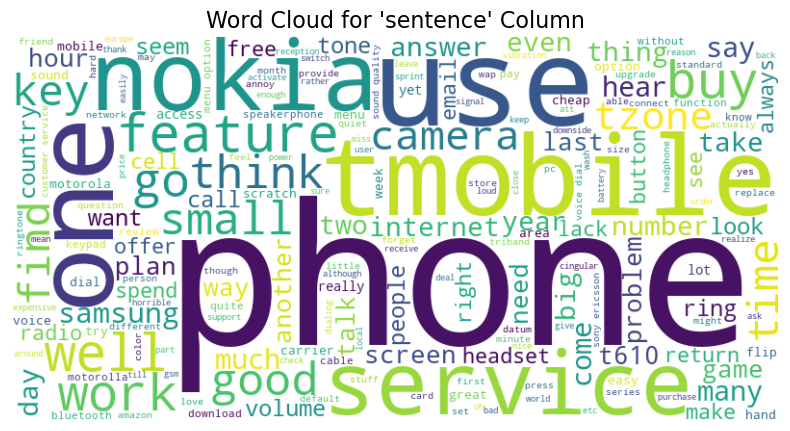

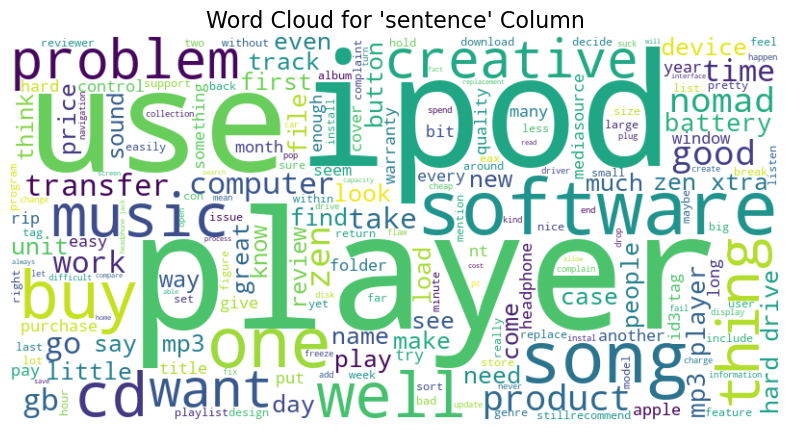

In [68]:
# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']<=0]
    preprocessed_data = [preprocess_text(text) for text in data['sentence']]
    create_wordcloud(preprocessed_data)


### Positive and Negative Sentiment Distribution

In [54]:
def titlewise_Analysis(df):
    df_group = (
        df.groupby('title')
        .agg(
            positive_count=('sentiment_total', lambda x: (x > 0).sum()),
            negative_count=('sentiment_total', lambda x: (x < 0).sum()),
            total_count=('sentiment_total', 'count'),
            mean=('sentiment_total', 'mean'),
            Overall_sentiment=('sentiment_total', 'sum'),
        )
        .reset_index()
    )
    df_group.loc[df_group['Overall_sentiment'] > 0, 'Sentiment'] = 'Positive'
    df_group.loc[df_group['Overall_sentiment'] <= 0, 'Sentiment'] = 'Negative'
    return df_group

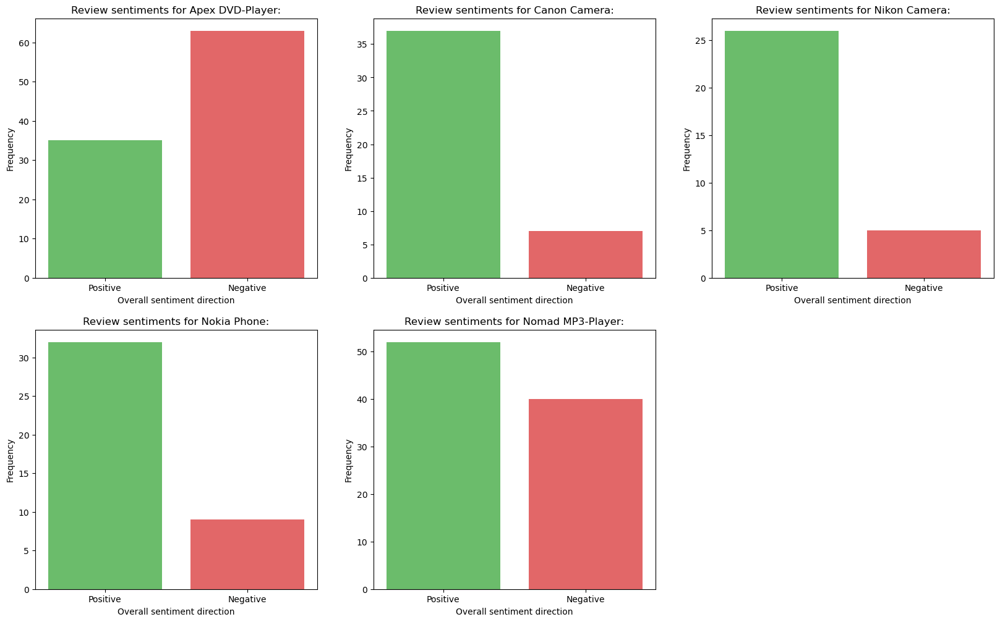

In [76]:
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
shortened_product_names = {
    "apex_ad2600_dvd_player_updated": "Apex DVD-Player",
    "canon_g3_updated": "Canon Camera",
    "nikon_coolpix_4300_updated": "Nikon Camera",
    "nokia_6610_updated": "Nokia Phone",
    "nomad_jukebox_zen_xtra_updated": "Nomad MP3-Player",
}


def write_positive_negative_distribution_to_excel():
    with pd.ExcelWriter('Positive_Negative_Distribution.xlsx') as writer:
        for product in prod_Lis:
            file_path = f'../processed_data/{product}.csv'
            data = pd.read_csv(file_path)
            data_group= titlewise_Analysis(data)
            data_group.to_excel(writer, sheet_name=product, index=False)


fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes: list[plt.Axes] = axes.ravel()

for i, product in enumerate(prod_Lis):
    data = pd.read_csv(f'../processed_data/{product}.csv')
    sentiment_counts = titlewise_Analysis(data)['Sentiment'].value_counts()
    sentiment_counts.sort_index(ascending=False, inplace=True)
    axes[i].bar(x = sentiment_counts.index, height = sentiment_counts.values, color = ['tab:green', 'tab:red'], alpha=0.7)
    axes[i].set_title(f'Review sentiments for {shortened_product_names[product]}:')
    axes[i].set_xlabel('Overall sentiment direction')
    axes[i].set_ylabel('Frequency')
    # axes[i].set_xticks(rotation=0)  # To keep x-axis labels horizontal
axes[5].remove()

Text(0.5, 1.0, 'Overall frequency of sentence sentiment directions')

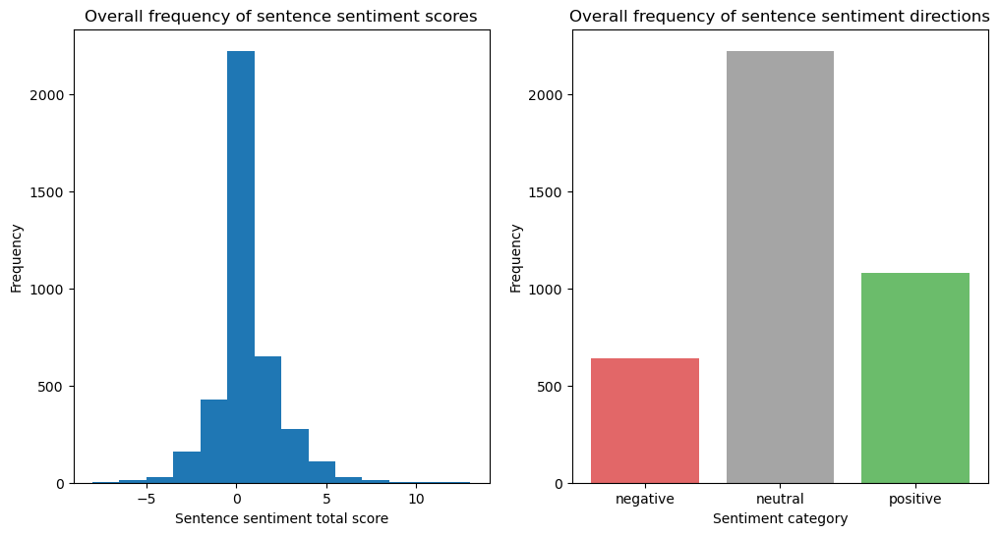

In [95]:
import numpy as np

conditions = [
    master_df['sentiment_total'] > 0,  # Positive sentiment
    master_df['sentiment_total'] < 0,  # Negative sentiment
    master_df['sentiment_total'] == 0  # Neutral sentiment
]
labels = ['positive', 'negative', 'neutral']
master_df['sentiment_category'] = np.select(conditions, labels)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].hist(master_df['sentiment_total'], bins=14)
axes[0].set_xlabel('Sentence sentiment total score')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Overall frequency of sentence sentiment scores')

category_counts = master_df['sentiment_category'].value_counts()
category_counts.sort_index(ascending=True, inplace=True)
axes[1].bar(x = category_counts.index, height = category_counts.values, color = ['tab:red', 'tab:gray', 'tab:green'], alpha=0.7)
axes[1].set_xlabel('Sentiment category')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Overall frequency of sentence sentiment directions')

### Distribution of text length

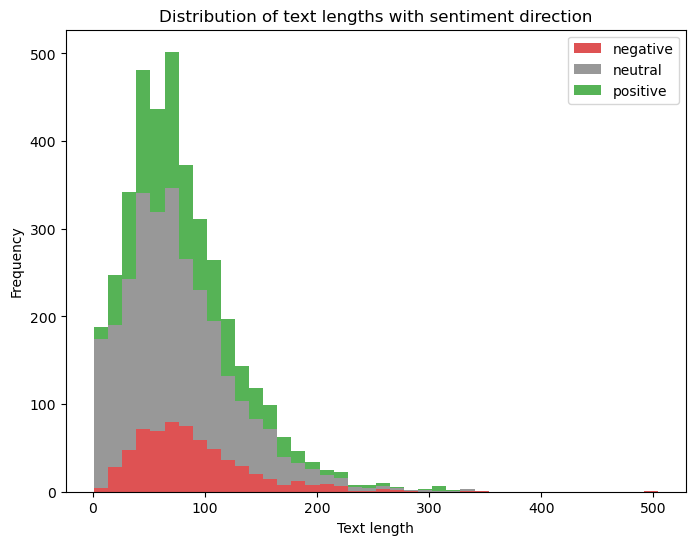

In [122]:
def plot_individual_product_text_length_distributions(): # Unused
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes: list[plt.Axes] = axes.ravel()

    prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
    for i, product in enumerate(prod_Lis):
        data = pd.read_csv(f'../processed_data/{product}.csv')
        data['text_length'] = data['sentence'].apply(lambda x: len(str(x)))
        
        conditions = [
            data['sentiment_total'] > 0,  # Positive sentiment
            data['sentiment_total'] < 0,  # Negative sentiment
            data['sentiment_total'] == 0  # Neutral sentiment
        ]
        labels = ['positive', 'negative', 'neutral']
        data['sentiment_category'] = np.select(conditions, labels)
        color_dict = {"negative": "tab:red", "neutral": "tab:gray", "positive": "tab:green"}

        # Collect data for stacking
        stacked_data = []
        for sentiment in color_dict.keys():
            subset = data[data['sentiment_category'] == sentiment]['text_length']
            stacked_data.append(subset)

        axes[i].hist(stacked_data, bins=25, color=list(color_dict.values()), label=list(color_dict.keys()), stacked=True, alpha=0.8)
        axes[i].set_title(f'Distribution of Text Lengths {product}')
        axes[i].set_xlabel('Text Length')
        axes[i].set_ylabel('Frequency')

master_df['text_length'] = master_df['sentence'].apply(lambda x: len(str(x)))

color_dict = {"negative": "tab:red", "neutral": "tab:gray", "positive": "tab:green"}
stacked_data = []
for sentiment in color_dict.keys():
    subset = master_df[master_df['sentiment_category'] == sentiment]['text_length']
    stacked_data.append(subset)

# Create the histogram
plt.figure(figsize=(8, 6))
plt.hist(stacked_data, bins=40, color=list(color_dict.values()), label=list(color_dict.keys()), stacked=True, alpha=0.8)
plt.title('Distribution of text lengths with sentiment direction')
plt.xlabel('Text length')
plt.ylabel('Frequency')
plt.legend()


##### High Positive Word Distribution

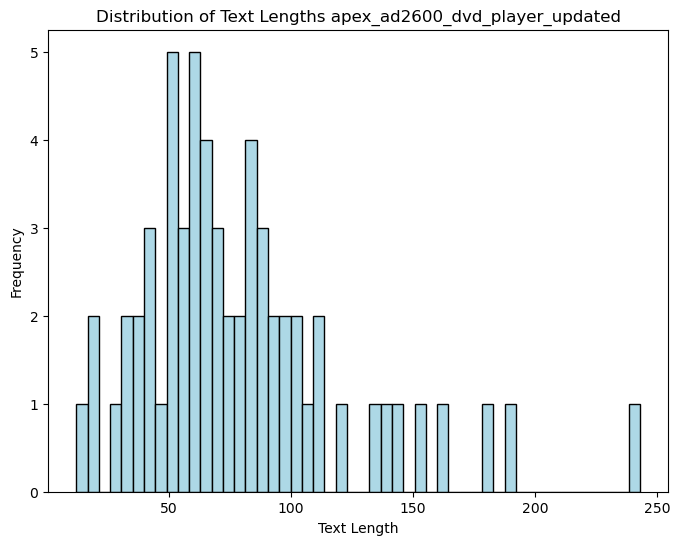

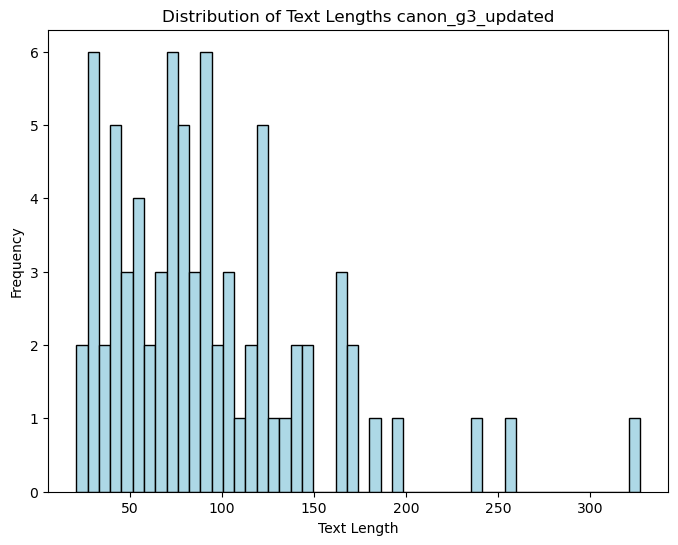

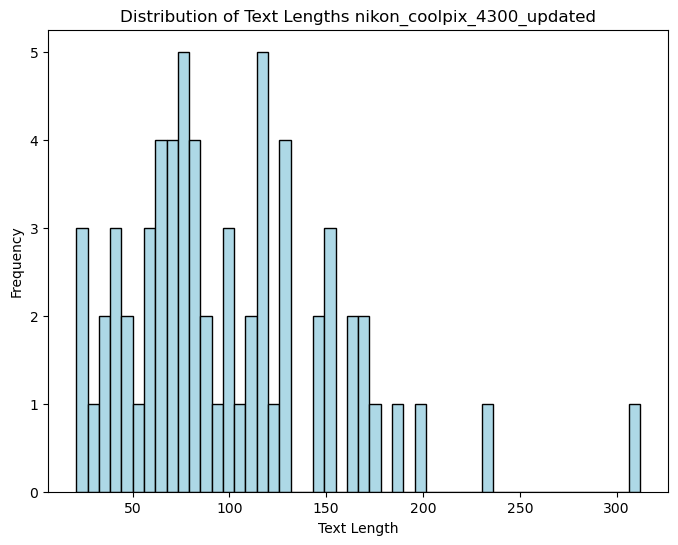

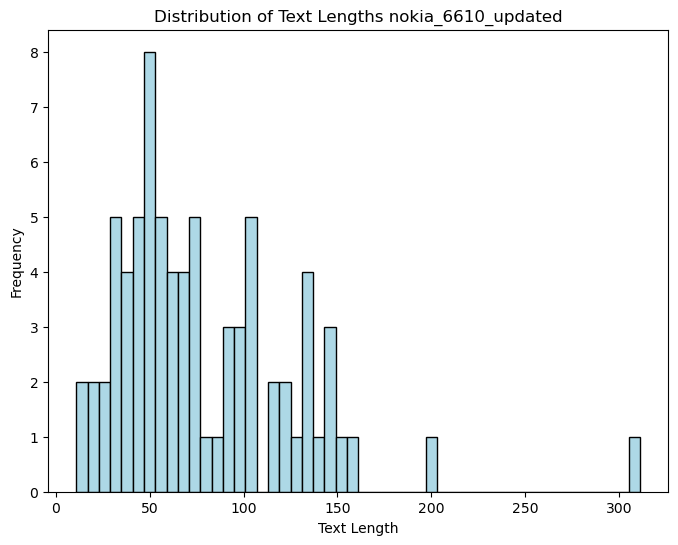

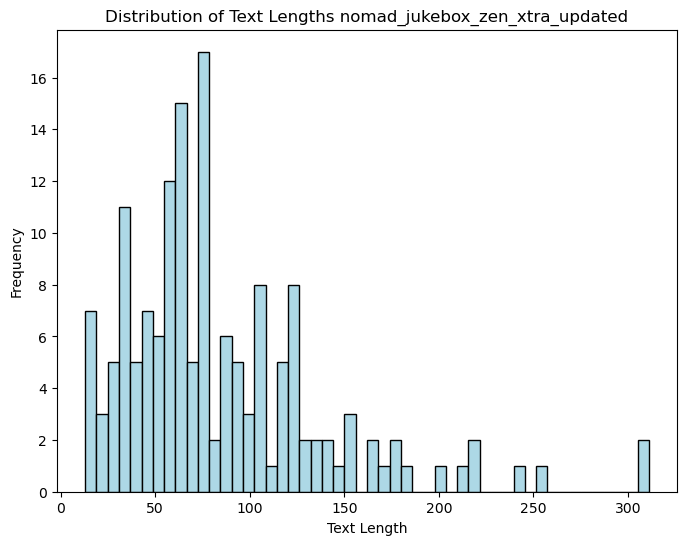

In [69]:
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']>=3]
    # Add a column for text length
    data['text_length'] = data['sentence'].apply(lambda x: len(str(x)))
    
    # Plot distribution of text lengths
    plt.figure(figsize=(8, 6))
    plt.hist(data['text_length'], bins=50, color='lightblue', edgecolor='black')
    plt.title(f'Distribution of Text Lengths {product}')
    plt.xlabel('Text Length')
    plt.ylabel('Frequency')
    plt.show()


##### Negative Word Distribution

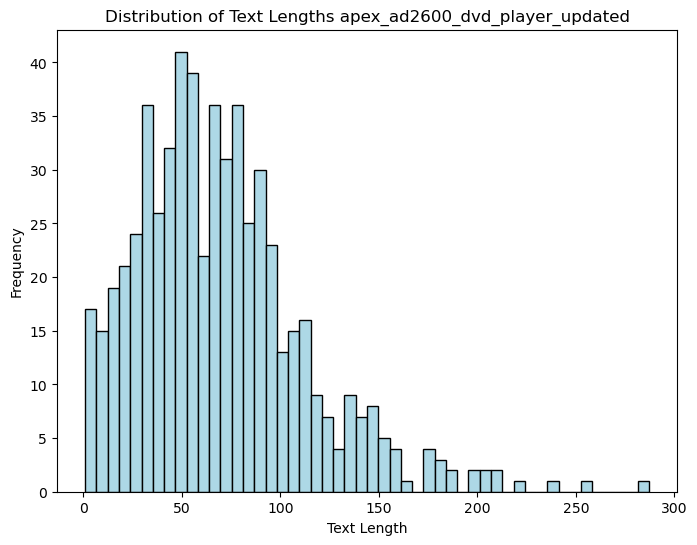

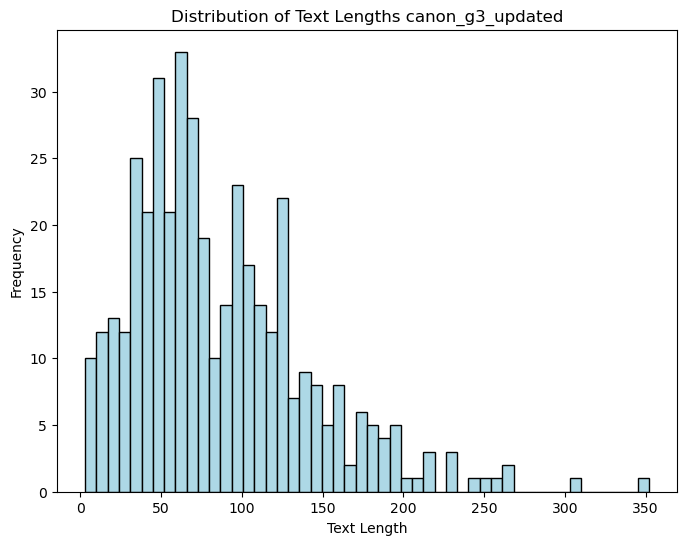

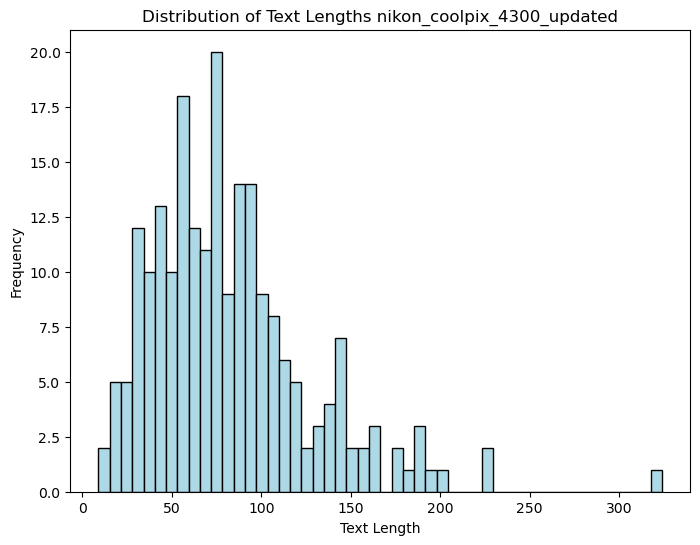

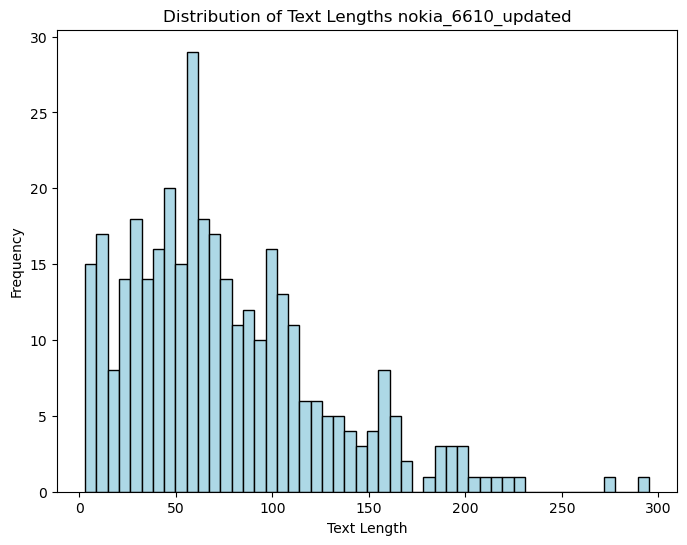

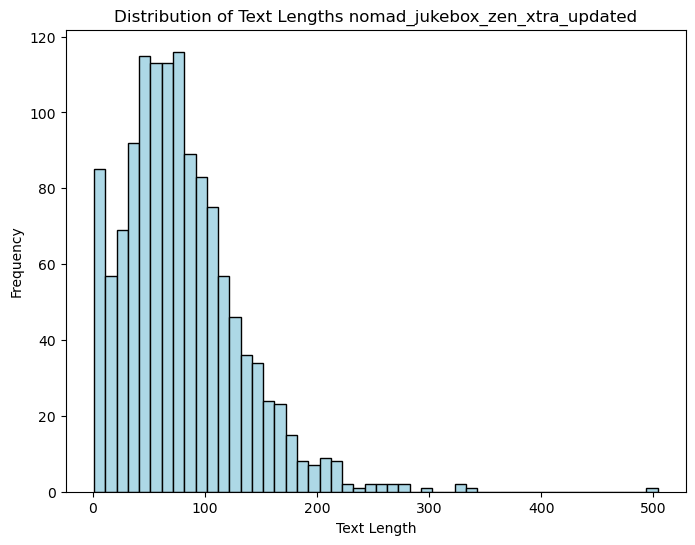

In [72]:
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']<=0]
    # Add a column for text length
    data['text_length'] = data['sentence'].apply(lambda x: len(str(x)))
    
    # Plot distribution of text lengths
    plt.figure(figsize=(8, 6))
    plt.hist(data['text_length'], bins=50, color='lightblue', edgecolor='black')
    plt.title(f'Distribution of Text Lengths {product}')
    plt.xlabel('Text Length')
    plt.ylabel('Frequency')
    plt.show()


### Parts of Speech (Need to understand what to do with this analysis)

In [54]:
import pandas as pd
import spacy
from textblob import TextBlob

# Load spaCy's pre-trained English model
nlp = spacy.load("en_core_web_sm")

product= 'apex_ad2600_dvd_player_updated'
file_path = f'..\processed_data\{product}.csv'
data = pd.read_csv(file_path)#['sentence']

# Function to perform POS tagging and sentiment analysis
def analyze_sentiment_and_pos(sentence):
    # POS Tagging with spaCy
    doc = nlp(sentence)
    pos_tags = [(token.text, token.pos_, token.dep_) for token in doc]
    
    # Sentiment Analysis with TextBlob
    blob = TextBlob(sentence)
    sentiment = blob.sentiment.polarity
    if sentiment > 0:
        sentiment_label = "Positive"
    elif sentiment < 0:
        sentiment_label = "Negative"
    else:
        sentiment_label = "Neutral"
    
    return pos_tags, sentiment, sentiment_label

# Apply the function to each row in the DataFrame
data[['pos_tags', 'sentiment_polarity', 'sentiment_label']] = data['sentence'].apply(
    lambda x: pd.Series(analyze_sentiment_and_pos(x))
)

# Display the result
print(data)


      Unnamed: 0                                 title  \
0              0    a quick update to the new zen nx ?   
1              1    a quick update to the new zen nx ?   
2              2    a quick update to the new zen nx ?   
3              3    a quick update to the new zen nx ?   
4              4    a quick update to the new zen nx ?   
...          ...                                   ...   
1711        1711  nomad be wonderful but be carefull !   
1712        1712  nomad be wonderful but be carefull !   
1713        1713  nomad be wonderful but be carefull !   
1714        1714  nomad be wonderful but be carefull !   
1715        1715  nomad be wonderful but be carefull !   

                                               sentence  \
0     this be an edited review now that i have have ...   
1     while there be flaw with the machine the xtra ...   
2            it be the most bang-for-the-buck out there   
3     like it s predecessor the quickly revise nx th...   
4     th

### Word graph

##### Highly negative <-5 word graph

In [ ]:
# Tokenize text and create co-occurrence pairs
def get_cooccurrence_pairs(sentence):
    words = sentence.split()
    return list(combinations(words, 2))

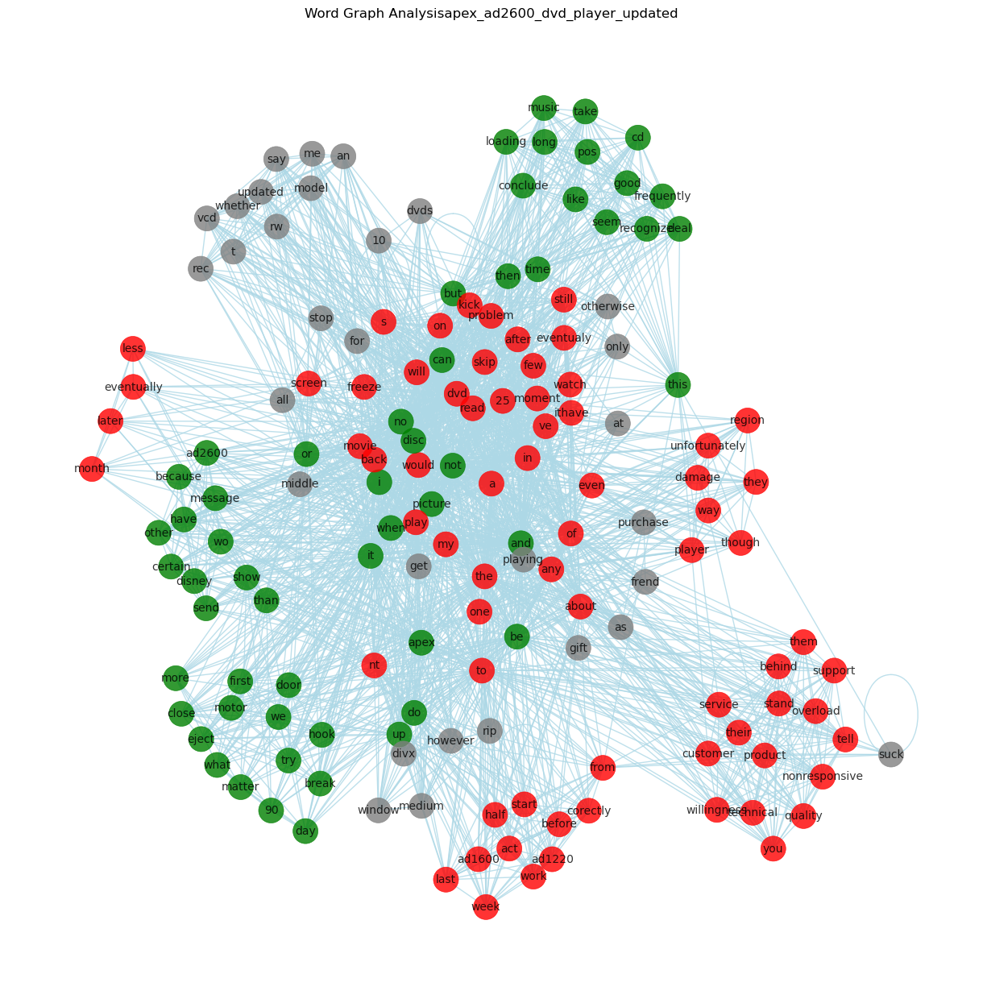

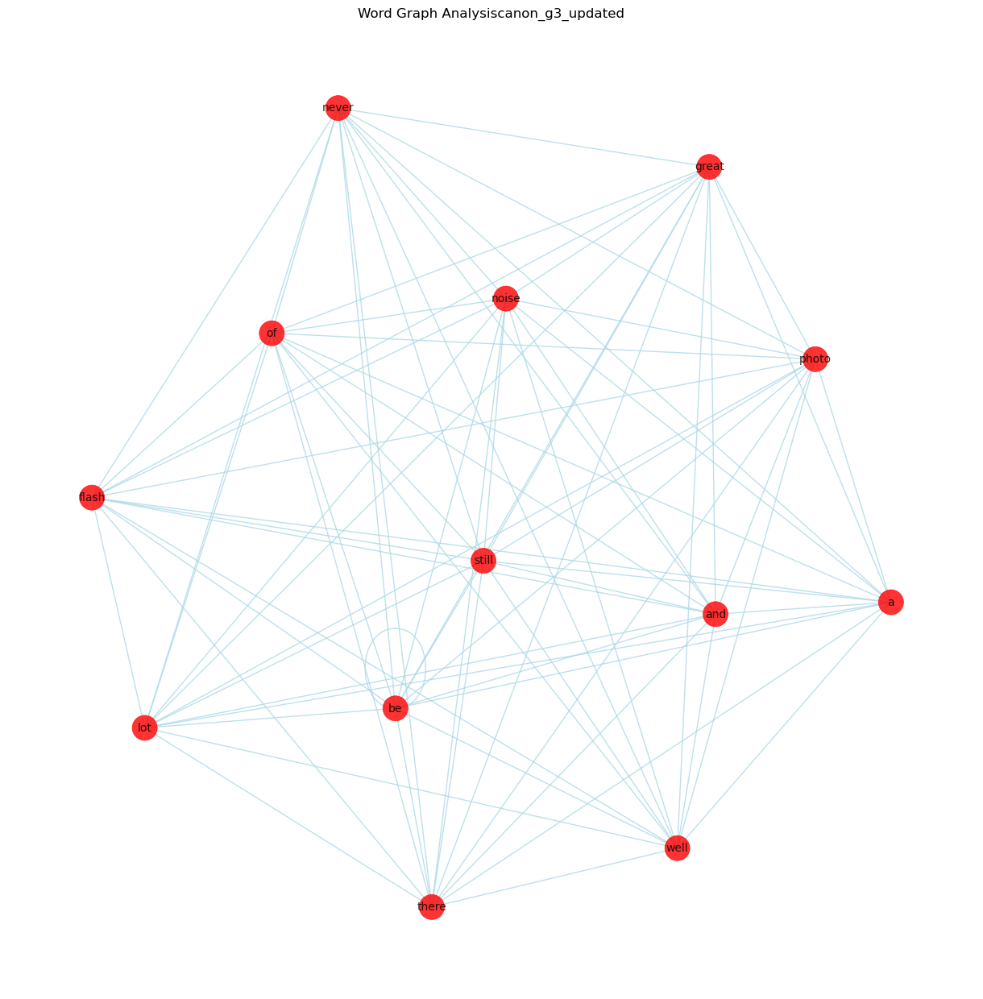

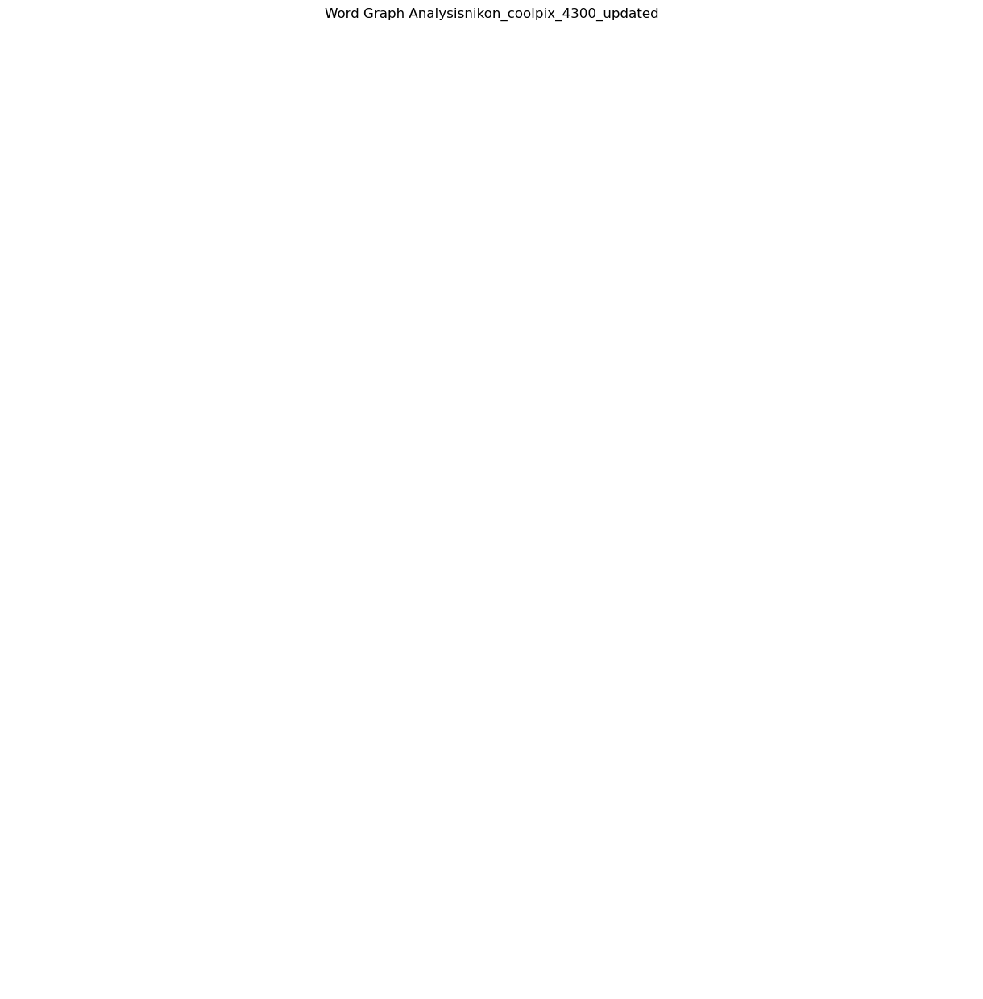

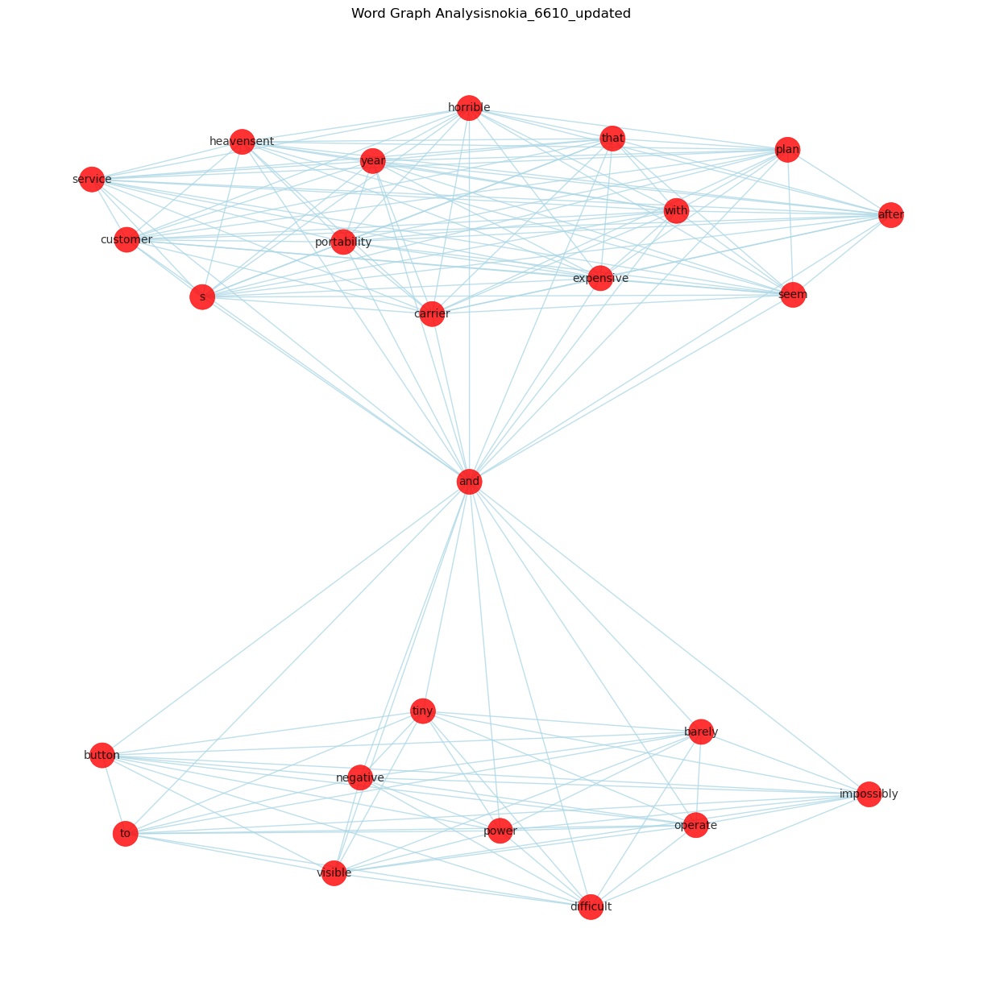

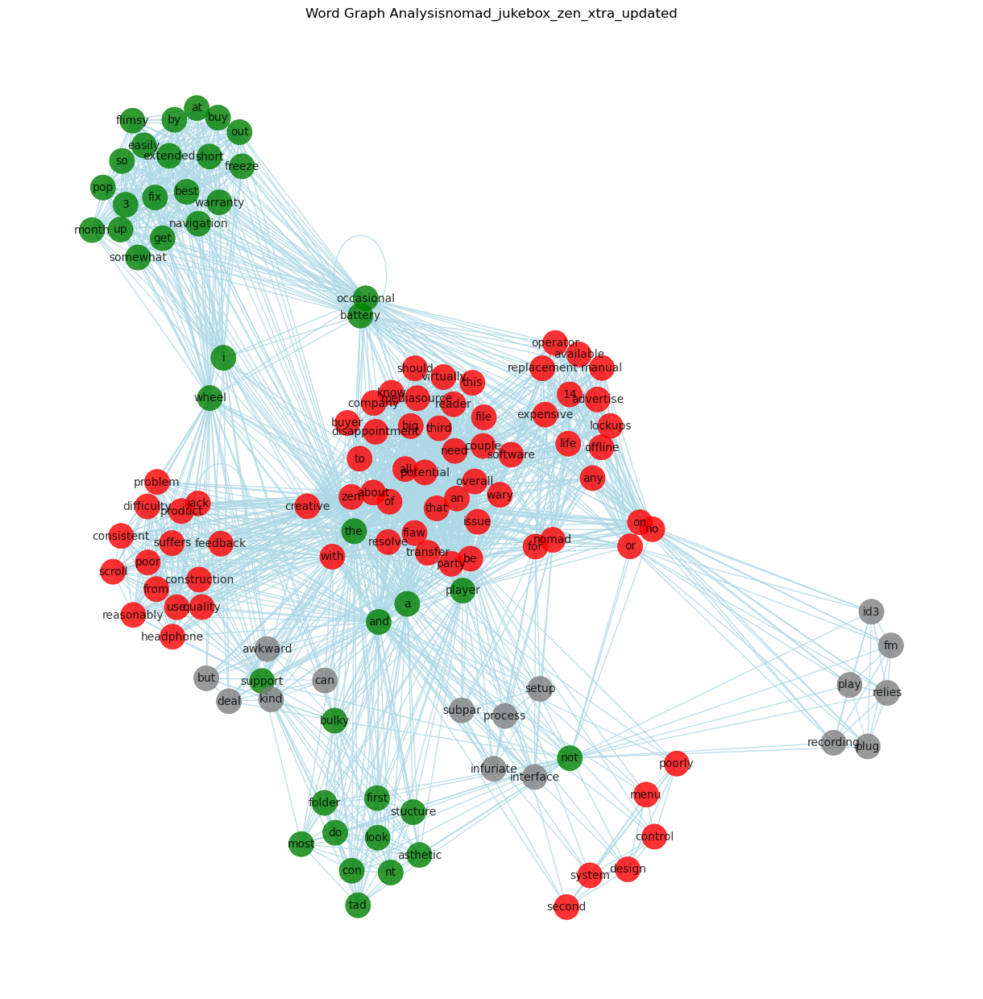

In [82]:

# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']<=-5]
    # Preprocess the data
    data['cleaned_sentence'] = data['sentence'].apply(preprocess_text)
    # Analyze sentiment
    data['sentiment'] = data['sentence'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
    # Get Pairs
    data['pairs'] = data['cleaned_sentence'].apply(get_cooccurrence_pairs)
    # Flatten the list of pairs
    all_pairs = [pair for pairs in data['pairs'] for pair in pairs]
    # Count the pairs
    pair_counts = Counter(all_pairs)
    # Create a graph
    G = nx.Graph()
    # Add edges to the graph with weights
    for pair, weight in pair_counts.items():
        G.add_edge(pair[0], pair[1], weight=weight)
    # Node coloring based on sentiment
    node_colors = []
    for node in G.nodes():
        sentiments = data[data['cleaned_sentence'].str.contains(rf'\b{node}\b', regex=True)]['sentiment']
        avg_sentiment = sentiments.mean() if not sentiments.empty else 0
        if avg_sentiment > 0:
            node_colors.append('green')  # Positive sentiment
        elif avg_sentiment < 0:
            node_colors.append('red')    # Negative sentiment
        else:
            node_colors.append('gray')   # Neutral sentiment
    # Draw the graph
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G, k=0.15, iterations=20)  # Layout for visualization
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_size=500,
        font_size=10,
        node_color=node_colors,
        edge_color='lightblue',
        linewidths=0.5,
        alpha=0.8
    )
    plt.title(f'Word Graph Analysis{product}')
    plt.show()


##### Highly Positive

In [ ]:

# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']>=5]
    # Preprocess the data
    data['cleaned_sentence'] = data['sentence'].apply(preprocess_text)
    # Analyze sentiment
    data['sentiment'] = data['sentence'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
    # Get Pairs
    data['pairs'] = data['cleaned_sentence'].apply(get_cooccurrence_pairs)
    # Flatten the list of pairs
    all_pairs = [pair for pairs in data['pairs'] for pair in pairs]
    # Count the pairs
    pair_counts = Counter(all_pairs)
    # Create a graph
    G = nx.Graph()
    # Add edges to the graph with weights
    for pair, weight in pair_counts.items():
        G.add_edge(pair[0], pair[1], weight=weight)
    # Node coloring based on sentiment
    node_colors = []
    for node in G.nodes():
        sentiments = data[data['cleaned_sentence'].str.contains(rf'\b{node}\b', regex=True)]['sentiment']
        avg_sentiment = sentiments.mean() if not sentiments.empty else 0
        if avg_sentiment > 0:
            node_colors.append('green')  # Positive sentiment
        elif avg_sentiment < 0:
            node_colors.append('red')    # Negative sentiment
        else:
            node_colors.append('gray')   # Neutral sentiment
    # Draw the graph
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G, k=0.15, iterations=20)  # Layout for visualization
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_size=500,
        font_size=10,
        node_color=node_colors,
        edge_color='lightblue',
        linewidths=0.5,
        alpha=0.8
    )
    plt.title(f'Word Graph Analysis{product}')
    plt.show()
